<a href="https://colab.research.google.com/github/montesinos8/TFM_48763797W_Predicci-n-de-accidentes-en-el-rea-Metropolitana-de-Madrid/blob/main/FORESCASTING_LSTM_HORAS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install skforecast

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 670.5/670.5 kB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 362.8/362.8 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 4.0 MB/s eta 0:00:00


In [ ]:
pip install keras

In [ ]:
pip install plotly --upgrade

In [ ]:
pip install astral

In [ ]:
# Procesado de datos

import os
import pandas as pd
import numpy as np
from skforecast.datasets import fetch_dataset
import re
# Gráficos

import matplotlib.pyplot as plt
from skforecast.plot import set_dark_theme
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly.offline as poff
pio.templates.default = "seaborn"
poff.init_notebook_mode(connected=True)

# Keras

os.environ["KERAS_BACKEND"] = "tensorflow" # 'tensorflow', 'jax´ or 'torch'
import keras
from keras.optimizers import Adam
from keras.losses import MeanSquaredError
from keras.callbacks import EarlyStopping

plt.style.use('seaborn-v0_8')
#plt.style.use('ggplot')


# Modelado

import skforecast
from skforecast.ForecasterRnn import ForecasterRnn
from skforecast.ForecasterRnn.utils import create_and_compile_model
from sklearn.preprocessing import MinMaxScaler
from skforecast.model_selection_multiseries import backtesting_forecaster_multiseries

from astral import LocationInfo
from astral.sun import sun


from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas.plotting import autocorrelation_plot

import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from skforecast.plot import plot_residuals
import plotly.graph_objects as go
import plotly.io as pio
import plotly.offline as poff

plt.style.use('seaborn-v0_8')
#plt.style.use('ggplot')

import plotly.io as pio
pio.renderers.default = 'colab'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
file_path = '/content/drive/My Drive/TFM/csv_tfm/ACCIDENTES_H_DB.csv'

accidentes_df= pd.read_csv(file_path, sep=',')
accidentes_df =accidentes_df.sort_values(by='FECHA')
accidentes_df

,FECHA,NUM_ACCIDENTES,TMEDIA,PRECIPITACION,RACHA,FESTIVO,CONFINAMIENTO,RESTRICCION_HORARIA,RESTRICCION_TERRITORIAL,NUM_VEHICULOS
0,2010-01-01 00:00:00,3,5.566667,0.05,18.233333,1,0,0,0,4307658.0
1,2010-01-01 02:00:00,8,5.566667,0.05,18.233333,1,0,0,0,4307658.0
2,2010-01-01 04:00:00,2,5.566667,0.05,18.233333,1,0,0,0,4307658.0
3,2010-01-01 08:00:00,11,5.566667,0.05,18.233333,1,0,0,0,4307658.0
4,2010-01-01 10:00:00,3,5.566667,0.05,18.233333,1,0,0,0,4307658.0
...,...,...,...,...,...,...,...,...,...,...
66813,2023-12-31 18:00:00,5,7.050000,0.00,9.675000,0,0,0,0,5400000.0
66814,2023-12-31 19:00:00,13,7.050000,0.00,9.675000,0,0,0,0,5400000.0
66815,2023-12-31 20:00:00,9,7.050000,0.00,9.675000,0,0,0,0,5400000.0
66816,2023-12-31 21:00:00,8,7.050000,0.00,9.675000,0,0,0,0,5400000.0


In [ ]:
accidentes_df['FECHA'] = pd.to_datetime(accidentes_df['FECHA'])
accidentes_df.set_index('FECHA', inplace=True)
accidentes_df = accidentes_df.asfreq('h')
accidentes_df=accidentes_df.sort_index()
accidentes_df

,NUM_ACCIDENTES,TMEDIA,PRECIPITACION,RACHA,FESTIVO,CONFINAMIENTO,RESTRICCION_HORARIA,RESTRICCION_TERRITORIAL,NUM_VEHICULOS
FECHA,,,,,,,,,
2010-01-01 00:00:00,3.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0
2010-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-01 02:00:00,8.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0
2010-01-01 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-01 04:00:00,2.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0
...,...,...,...,...,...,...,...,...,...
2023-12-31 18:00:00,5.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0
2023-12-31 19:00:00,13.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0
2023-12-31 20:00:00,9.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0


## Tratamiento de nulos

In [ ]:
# prompt: saber cuantas puntos nulo hay, que fechas son

null_counts = accidentes_df.isnull().sum()
print("Número de valores nulos en cada columna:")
print(null_counts)

null_rows = accidentes_df[accidentes_df.isnull().any(axis=1)]
print("\nFechas con valores nulos:")
print(null_rows.index)


Número de valores nulos en cada columna:
NUM_ACCIDENTES             55893
TMEDIA                     55893
PRECIPITACION              55893
RACHA                      55893
FESTIVO                    55893
CONFINAMIENTO              55893
RESTRICCION_HORARIA        55893
RESTRICCION_TERRITORIAL    55893
NUM_VEHICULOS              55893
dtype: int64

Fechas con valores nulos:
DatetimeIndex(['2010-01-01 01:00:00', '2010-01-01 03:00:00',
               '2010-01-01 05:00:00', '2010-01-01 06:00:00',
               '2010-01-01 07:00:00', '2010-01-01 09:00:00',
               '2010-01-01 11:00:00', '2010-01-01 12:00:00',
               '2010-01-01 13:00:00', '2010-01-01 14:00:00',
               ...
               '2023-12-28 21:00:00', '2023-12-28 23:00:00',
               '2023-12-29 00:00:00', '2023-12-29 02:00:00',
               '2023-12-29 08:00:00', '2023-12-29 15:00:00',
               '2023-12-29 23:00:00', '2023-12-30 08:00:00',
               '2023-12-31 04:00:00', '2023-12-31 05:0

In [ ]:

# Asegúrate de que el índice esté en formato datetime
accidentes_df.index = pd.to_datetime(accidentes_df.index)

# Agrupar por día y obtener el valor máximo de las variables binarias para el día completo
binary_daily_max = accidentes_df.groupby(accidentes_df.index.date).agg({
    'FESTIVO': 'max',
    'CONFINAMIENTO': 'max',
    'RESTRICCION_HORARIA': 'max',
    'RESTRICCION_TERRITORIAL': 'max',
    'NUM_VEHICULOS': 'max'
}).reset_index()

# Cambiar el nombre de la columna de índice en binary_daily_max a 'FECHA_SOLO' para el merge
binary_daily_max.rename(columns={'index': 'FECHA_SOLO'}, inplace=True)

# Crear una nueva columna FECHA_SOLO basada en el índice del DataFrame de accidentes
accidentes_df['FECHA_SOLO'] = accidentes_df.index.date

# Mantener el índice original para restaurarlo después del merge
accidentes_df['FECHA'] = accidentes_df.index

# Realizar el merge de los máximos diarios de variables binarias con los datos originales
accidentes_df = pd.merge(accidentes_df, binary_daily_max, left_on='FECHA_SOLO', right_on='FECHA_SOLO', how='left', suffixes=('', '_max'))

# Rellenar las columnas binarias con los valores máximos por día (en las horas que faltan)
accidentes_df['FESTIVO'].fillna(accidentes_df['FESTIVO_max'], inplace=True)
accidentes_df['CONFINAMIENTO'].fillna(accidentes_df['CONFINAMIENTO_max'], inplace=True)
accidentes_df['RESTRICCION_HORARIA'].fillna(accidentes_df['RESTRICCION_HORARIA_max'], inplace=True)
accidentes_df['RESTRICCION_TERRITORIAL'].fillna(accidentes_df['RESTRICCION_TERRITORIAL_max'], inplace=True)
accidentes_df['NUM_VEHICULOS'].fillna(accidentes_df['NUM_VEHICULOS_max'], inplace=True)

# Eliminar las columnas auxiliares y restaurar el índice de fechas y horas
accidentes_df.drop(columns=['FESTIVO_max', 'CONFINAMIENTO_max', 'RESTRICCION_HORARIA_max', 'RESTRICCION_TERRITORIAL_max', 'FECHA_SOLO', 'NUM_VEHICULOS_max'], inplace=True)
accidentes_df.set_index('FECHA', inplace=True)

# Asegurarse de que no queden nulos
accidentes_df.fillna(0, inplace=True)

# Revisar el resultado
print(accidentes_df.head())


                     NUM_ACCIDENTES    TMEDIA  PRECIPITACION      RACHA  \
FECHA                                                                     
2010-01-01 00:00:00             3.0  5.566667           0.05  18.233333   
2010-01-01 01:00:00             0.0  0.000000           0.00   0.000000   
2010-01-01 02:00:00             8.0  5.566667           0.05  18.233333   
2010-01-01 03:00:00             0.0  0.000000           0.00   0.000000   
2010-01-01 04:00:00             2.0  5.566667           0.05  18.233333   

                     FESTIVO  CONFINAMIENTO  RESTRICCION_HORARIA  \
FECHA                                                              
2010-01-01 00:00:00      1.0            0.0                  0.0   
2010-01-01 01:00:00      1.0            0.0                  0.0   
2010-01-01 02:00:00      1.0            0.0                  0.0   
2010-01-01 03:00:00      1.0            0.0                  0.0   
2010-01-01 04:00:00      1.0            0.0                  0.0  

<ipython-input-31-fcdff9e3d185>:26: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



<ipython-input-31-fcdff9e3d185>:27: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or d

In [ ]:
print(f"Tipo de índice: {accidentes_df.index.dtype}")
print(f"Frecuencia: {accidentes_df.index.freq}")

Tipo de índice: datetime64[ns]
Frecuencia: None


In [ ]:
accidentes_df

,NUM_ACCIDENTES,TMEDIA,PRECIPITACION,RACHA,FESTIVO,CONFINAMIENTO,RESTRICCION_HORARIA,RESTRICCION_TERRITORIAL,NUM_VEHICULOS
FECHA,,,,,,,,,
2010-01-01 00:00:00,4307658.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0
2010-01-01 01:00:00,4307658.0,0.000000,0.00,0.000000,1.0,0.0,0.0,0.0,4307658.0
2010-01-01 02:00:00,4307658.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0
2010-01-01 03:00:00,4307658.0,0.000000,0.00,0.000000,1.0,0.0,0.0,0.0,4307658.0
2010-01-01 04:00:00,4307658.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0
...,...,...,...,...,...,...,...,...,...
2023-12-31 18:00:00,5400000.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0
2023-12-31 19:00:00,5400000.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0
2023-12-31 20:00:00,5400000.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0


In [ ]:
accidentes_df = accidentes_df.asfreq('h')


In [ ]:
accidentes_df = accidentes_df.copy()

# Filtrar las fechas que necesitas, ya que el índice ahora debería incluir las horas
accidentes_df = accidentes_df.loc['2010-01-01 00:00:00': '2023-12-31 23:59:59'].copy()

# Definir las fechas de los conjuntos de entrenamiento, validación y test
fin_train = '2019-12-31 23:59:59'
ini_val = '2020-01-01 00:00:00'
fin_val = '2022-12-31 23:59:59'
ini_test = '2023-01-01 00:00:00'

# Crear los subconjuntos para cada fase (train, val, test)
accidentes_df_train = accidentes_df.loc[:fin_train].copy()
accidentes_df_val   = accidentes_df.loc[ini_val:fin_val].copy()
accidentes_df_test  = accidentes_df.loc[ini_test:].copy()

# Mostrar las fechas mínimas y máximas de cada conjunto
print(f"Fechas train      : {accidentes_df_train.index.min()} --- {accidentes_df_train.index.max()}")
print(f"Fechas validacion : {accidentes_df_val.index.min()} --- {accidentes_df_val.index.max()}")
print(f"Fechas test       : {accidentes_df_test.index.min()} --- {accidentes_df_test.index.max()}")


Fechas train      : 2010-01-01 00:00:00 --- 2019-12-31 23:00:00
Fechas validacion : 2020-01-01 00:00:00 --- 2022-12-31 23:00:00
Fechas test       : 2023-01-01 00:00:00 --- 2023-12-31 22:00:00


In [ ]:

print(
    f"Fechas train      : {accidentes_df_train.index.min()} --- "
    f"{accidentes_df_train.index.max()}  (n={len(accidentes_df_train)})"
)
print(
    f"Fechas validation : {accidentes_df_val.index.min()} --- "
    f"{accidentes_df_val.index.max()}  (n={len(accidentes_df_val)})"
)
print(
    f"Fechas test       : {accidentes_df_test.index.min()} --- "
    f"{accidentes_df_test.index.max()}  (n={len(accidentes_df_test)})"
)


Fechas train      : 2010-01-01 00:00:00 --- 2019-12-31 23:00:00  (n=87648)
Fechas validation : 2020-01-01 00:00:00 --- 2022-12-31 23:00:00  (n=26304)
Fechas test       : 2023-01-01 00:00:00 --- 2023-12-31 22:00:00  (n=8759)


In [ ]:

date_ranges = {
    'Entrenamiento': (accidentes_df_train.index.min(), accidentes_df_train.index.max()),
    'Validacion': (accidentes_df_val.index.min(), accidentes_df_val.index.max()),
    'Test': (accidentes_df_test.index.min(), accidentes_df_test.index.max())
}

def analyze_accident_data(df, date_ranges):
    results = []
    for label, (start_date, end_date) in date_ranges.items():
        subset = df.loc[start_date:end_date]
        min_accidents = subset['NUM_ACCIDENTES'].min()
        max_accidents = subset['NUM_ACCIDENTES'].max()
        mean_accidents = subset['NUM_ACCIDENTES'].mean()
        results.append([label, min_accidents, max_accidents, mean_accidents])
    # Total analysis
    total_min = df['NUM_ACCIDENTES'].min()
    total_max = df['NUM_ACCIDENTES'].max()
    total_mean = df['NUM_ACCIDENTES'].mean()
    results.append(['Total', total_min, total_max, total_mean])
    return pd.DataFrame(results, columns=['Periodo', 'Minimo Accidentes', 'Maximo Accidentes', 'Media Accidentes'])

accident_analysis = analyze_accident_data(accidentes_df, date_ranges)
accident_analysis

,Periodo,Minimo Accidentes,Maximo Accidentes,Media Accidentes
0,Entrenamiento,0.0,50.0,3.477649
1,Validacion,0.0,49.0,4.610287
2,Test,0.0,62.0,5.574837
3,Total,0.0,62.0,3.870134


In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=accidentes_df_train.index, y=accidentes_df_train['NUM_ACCIDENTES'], mode='lines', name='Train'))
fig.add_trace(go.Scatter(x=accidentes_df_val.index, y=accidentes_df_val['NUM_ACCIDENTES'], mode='lines', name='Validation'))
fig.add_trace(go.Scatter(x=accidentes_df_test.index, y=accidentes_df_test['NUM_ACCIDENTES'], mode='lines', name='Test'))
fig.update_layout(
    title  = 'Número de Accidentes Diarios',
    xaxis_title='Fecha',
    yaxis_title='Número de Accidentes',
    legend_title="Partición:",
    width=850,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.001
    )
)

fig.show()

## PRIMER Modelo LSTM y ForecasterRnn

## Predicción de un día a futuro (Single step forecasting)

In [ ]:
series = ["NUM_ACCIDENTES"]
levels = ["NUM_ACCIDENTES"]
lags = 32
steps = 1

data_train = accidentes_df_train[series]
data_val   = accidentes_df_val[series]
data_test  = accidentes_df_test[series]

model = create_and_compile_model(
    series=data_train,
    levels=levels,
    lags=lags,
    steps=steps,
    recurrent_layer="LSTM",
    recurrent_units=32,
    dense_units=16,
    optimizer=Adam(learning_rate=0.001),
    loss=MeanSquaredError()
)
model.summary()

keras version: 3.4.1
Using backend: tensorflow
tensorflow version: 2.17.0


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 32, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 32)                  │           4,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 1)                   │              17 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_5 (Reshape)                  │ (None, 1, 1)                │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,897 (19.13 KB)

 Trainable params: 4,897 (19.13 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
forecaster = ForecasterRnn(
    regressor=model,
    levels=levels,
    transformer_series=MinMaxScaler(),
    fit_kwargs={
        "epochs": 25,  # Número de épocas para entrenar el modelo.
        "batch_size": 32,  # Tamaño del batch para entrenar el modelo.
        "callbacks": [
            EarlyStopping(monitor="val_loss", patience=5)
        ],  # Callback para detener el entrenamiento cuando ya no esté aprendiendo más.
        "series_val": data_val,  # Datos de validación para el entrenamiento del modelo.
    },
)
forecaster

/usr/local/lib/python3.10/dist-packages/skforecast/ForecasterRnn/ForecasterRnn.py:229: UserWarning:

Setting `lags` = 'auto'. `lags` are inferred from the regressor architecture. Avoid the warning with lags=lags.

/usr/local/lib/python3.10/dist-packages/skforecast/ForecasterRnn/ForecasterRnn.py:265: UserWarning:

`steps` default value = 'auto'. `steps` inferred from regressor architecture. Avoid the warning with steps=steps.



ForecasterRnn 
Regressor: <Functional name=functional_5, built=True> 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32] 
Transformer for series: MinMaxScaler() 
Window size: 32 
Target series, levels: ['NUM_ACCIDENTES'] 
Multivariate series (names): None 
Maximum steps predicted: [1] 
Training range: None 
Training index type: None 
Training index frequency: None 
Model parameters: {'name': 'functional_5', 'trainable': True, 'layers': [{'module': 'keras.layers', 'class_name': 'InputLayer', 'config': {'batch_shape': (None, 32, 1), 'dtype': 'float32', 'sparse': False, 'name': 'input_layer_5'}, 'registered_name': None, 'name': 'input_layer_5', 'inbound_nodes': []}, {'module': 'keras.layers', 'class_name': 'LSTM', 'config': {'name': 'lstm_5', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'return_sequences': False, 'return_state': False, 'go_backward

In [ ]:
forecaster.fit(data_train)

Epoch 1/25
2738/2738 ━━━━━━━━━━━━━━━━━━━━ 41s 14ms/step - loss: 0.0085 - val_loss: 0.0081
Epoch 2/25
2738/2738 ━━━━━━━━━━━━━━━━━━━━ 42s 14ms/step - loss: 0.0062 - val_loss: 0.0078
Epoch 3/25
2738/2738 ━━━━━━━━━━━━━━━━━━━━ 46s 16ms/step - loss: 0.0060 - val_loss: 0.0074
Epoch 4/25
2738/2738 ━━━━━━━━━━━━━━━━━━━━ 78s 15ms/step - loss: 0.0060 - val_loss: 0.0073
Epoch 5/25
2738/2738 ━━━━━━━━━━━━━━━━━━━━ 38s 14ms/step - loss: 0.0060 - val_loss: 0.0075
Epoch 6/25
2738/2738 ━━━━━━━━━━━━━━━━━━━━ 40s 13ms/step - loss: 0.0059 - val_loss: 0.0074
Epoch 7/25
2738/2738 ━━━━━━━━━━━━━━━━━━━━ 37s 13ms/step - loss: 0.0059 - val_loss: 0.0073
Epoch 8/25
2738/2738 ━━━━━━━━━━━━━━━━━━━━ 40s 13ms/step - loss: 0.0059 - val_loss: 0.0077
Epoch 9/25
2738/2738 ━━━━━━━━━━━━━━━━━━━━ 41s 13ms/step - loss: 0.0058 - val_loss: 0.0074


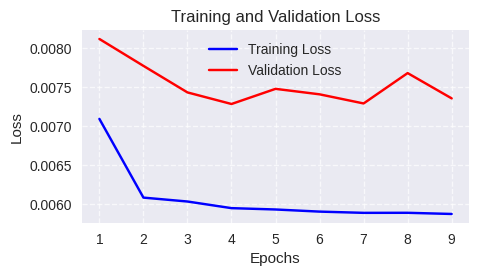

In [ ]:
# Seguimiento del entrenamiento y overfitting
# ==============================================================================
fig, ax = plt.subplots(figsize=(5, 2.5))
forecaster.plot_history(ax=ax)

el training loss disminuye significativamente en las primeras épocas y luego se estabiliza, mientras que el val loss muestra cierta variabilidad, pero parece que va disminuyendo.

In [ ]:

predictions = forecaster.predict()
predictions

,NUM_ACCIDENTES
2020-01-01,2.17135


Backtesting, simular entorno produccion

In [ ]:
data= accidentes_df['NUM_ACCIDENTES'].copy()

In [ ]:
print(f"Tipo de índice: {accidentes_df.index.dtype}")
print(f"Frecuencia: {accidentes_df.index.freq}")

Tipo de índice: datetime64[ns]
Frecuencia: <Hour>


In [ ]:
data= accidentes_df['NUM_ACCIDENTES'].copy()

In [ ]:


data = pd.DataFrame(data)


In [ ]:
# Backtesting con datos de test


metrics, predictions = backtesting_forecaster_multiseries(
    forecaster=forecaster,
    steps=forecaster.max_step,
    series=data,  # Utilizamos todo el dataframe con las series
    levels=forecaster.levels,
    initial_train_size=len(accidentes_df.loc[:fin_val,:]),  # Datos de entrenamiento + validación
    metric="mean_absolute_error",
    verbose=False,
    refit=False,
)

Epoch 1/25
3560/3560 ━━━━━━━━━━━━━━━━━━━━ 52s 14ms/step - loss: 0.0062 - val_loss: 0.0071
Epoch 2/25
3560/3560 ━━━━━━━━━━━━━━━━━━━━ 76s 12ms/step - loss: 0.0061 - val_loss: 0.0071
Epoch 3/25
3560/3560 ━━━━━━━━━━━━━━━━━━━━ 48s 14ms/step - loss: 0.0061 - val_loss: 0.0071
Epoch 4/25
3560/3560 ━━━━━━━━━━━━━━━━━━━━ 79s 13ms/step - loss: 0.0061 - val_loss: 0.0070
Epoch 5/25
3560/3560 ━━━━━━━━━━━━━━━━━━━━ 82s 13ms/step - loss: 0.0061 - val_loss: 0.0070
Epoch 6/25
3560/3560 ━━━━━━━━━━━━━━━━━━━━ 83s 13ms/step - loss: 0.0060 - val_loss: 0.0070
Epoch 7/25
3560/3560 ━━━━━━━━━━━━━━━━━━━━ 49s 14ms/step - loss: 0.0060 - val_loss: 0.0070
Epoch 8/25
3560/3560 ━━━━━━━━━━━━━━━━━━━━ 80s 13ms/step - loss: 0.0060 - val_loss: 0.0070
Epoch 9/25
3560/3560 ━━━━━━━━━━━━━━━━━━━━ 81s 13ms/step - loss: 0.0060 - val_loss: 0.0069
Epoch 10/25
3560/3560 ━━━━━━━━━━━━━━━━━━━━ 80s 12ms/step - loss: 0.0061 - val_loss: 0.0071
Epoch 11/25
3560/3560 ━━━━━━━━━━━━━━━━━━━━ 84s 13ms/step - loss: 0.0060 - val_loss: 0.0070
Epoch 12

  0%|          | 0/8759 [00:00<?, ?it/s]

In [ ]:
# Predicciones de backtesting
# ==============================================================================
predictions

,NUM_ACCIDENTES
2023-01-01 00:00:00,5.419858
2023-01-01 01:00:00,3.618362
2023-01-01 02:00:00,4.613813
2023-01-01 03:00:00,2.237130
2023-01-01 04:00:00,2.095999
...,...
2023-12-31 18:00:00,7.353522
2023-12-31 19:00:00,7.427900
2023-12-31 20:00:00,8.154546
2023-12-31 21:00:00,8.058766


In [ ]:
# Gráfico de las predicciones vs valores reales en el conjunto de test
# ==============================================================================
fig = go.Figure()
trace1 = go.Scatter(x=accidentes_df_test.index, y=accidentes_df_test['NUM_ACCIDENTES'], name="test", mode="lines")
trace2 = go.Scatter(x=predictions.index, y=predictions['NUM_ACCIDENTES'], name="predicciones", mode="lines")
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.update_layout(
    title="Predicciones vs valores reales en el conjunto de test",
    xaxis_title="Date time",
    yaxis_title="NUM_ACCIDENTES",
    width=750,
    height=350,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.05,
        xanchor="left",
        x=0
    )
)
fig.show()

In [ ]:
metrics

In [ ]:
# Error en % respecto a la media de la serie
# ==============================================================================
rel_mse = 100 * metrics.loc[0, 'mean_absolute_error'] / np.mean(data["NUM_ACCIDENTES"])
print(f"Media de la serie: {np.mean(data['NUM_ACCIDENTES']):0.2f}")
print(f"Error (mae) relativo: {rel_mse:0.2f} %")

Media de la serie: 3.87
Error (mae) relativo: 84.39 %


In [ ]:
# prompt: QUIERO EL MEAN ABSOLUTE ERROR

print(f"Mean Absolute Error: {metrics.loc[0, 'mean_absolute_error']}")


Media de la serie: 3.87
Error (mae) relativo: 84.39 %


## Modelo N:1

In [ ]:
file_path = '/content/drive/My Drive/TFM/csv_tfm/ACCIDENTES_H_DB.csv'

accidentes_df= pd.read_csv(file_path, sep=',')
accidentes_df =accidentes_df.sort_values(by='FECHA')
accidentes_df

,FECHA,NUM_ACCIDENTES,TMEDIA,PRECIPITACION,RACHA,FESTIVO,CONFINAMIENTO,RESTRICCION_HORARIA,RESTRICCION_TERRITORIAL,NUM_VEHICULOS
0,2010-01-01 00:00:00,3,5.566667,0.05,18.233333,1,0,0,0,4307658.0
1,2010-01-01 02:00:00,8,5.566667,0.05,18.233333,1,0,0,0,4307658.0
2,2010-01-01 04:00:00,2,5.566667,0.05,18.233333,1,0,0,0,4307658.0
3,2010-01-01 08:00:00,11,5.566667,0.05,18.233333,1,0,0,0,4307658.0
4,2010-01-01 10:00:00,3,5.566667,0.05,18.233333,1,0,0,0,4307658.0
...,...,...,...,...,...,...,...,...,...,...
66813,2023-12-31 18:00:00,5,7.050000,0.00,9.675000,0,0,0,0,5400000.0
66814,2023-12-31 19:00:00,13,7.050000,0.00,9.675000,0,0,0,0,5400000.0
66815,2023-12-31 20:00:00,9,7.050000,0.00,9.675000,0,0,0,0,5400000.0
66816,2023-12-31 21:00:00,8,7.050000,0.00,9.675000,0,0,0,0,5400000.0


In [ ]:
accidentes_df['FECHA'] = pd.to_datetime(accidentes_df['FECHA'])
accidentes_df.set_index('FECHA', inplace=True)
accidentes_df = accidentes_df.asfreq('h')
accidentes_df=accidentes_df.sort_index()
accidentes_df

,NUM_ACCIDENTES,TMEDIA,PRECIPITACION,RACHA,FESTIVO,CONFINAMIENTO,RESTRICCION_HORARIA,RESTRICCION_TERRITORIAL,NUM_VEHICULOS
FECHA,,,,,,,,,
2010-01-01 00:00:00,3.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0
2010-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-01 02:00:00,8.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0
2010-01-01 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010-01-01 04:00:00,2.0,5.566667,0.05,18.233333,1.0,0.0,0.0,0.0,4307658.0
...,...,...,...,...,...,...,...,...,...
2023-12-31 18:00:00,5.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0
2023-12-31 19:00:00,13.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0
2023-12-31 20:00:00,9.0,7.050000,0.00,9.675000,0.0,0.0,0.0,0.0,5400000.0


In [ ]:
accidentes_df.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 122711 entries, 2010-01-01 00:00:00 to 2023-12-31 22:00:00
Freq: h
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   NUM_ACCIDENTES           66818 non-null  float64
 1   TMEDIA                   66818 non-null  float64
 2   PRECIPITACION            66818 non-null  float64
 3   RACHA                    66818 non-null  float64
 4   FESTIVO                  66818 non-null  float64
 5   CONFINAMIENTO            66818 non-null  float64
 6   RESTRICCION_HORARIA      66818 non-null  float64
 7   RESTRICCION_TERRITORIAL  66818 non-null  float64
 8   NUM_VEHICULOS            66818 non-null  float64
dtypes: float64(9)
memory usage: 9.4 MB


In [ ]:

# Asegúrate de que el índice esté en formato datetime
accidentes_df.index = pd.to_datetime(accidentes_df.index)

# Agrupar por día y obtener el valor máximo de las variables binarias para el día completo
binary_daily_max = accidentes_df.groupby(accidentes_df.index.date).agg({
    'FESTIVO': 'max',
    'CONFINAMIENTO': 'max',
    'RESTRICCION_HORARIA': 'max',
    'RESTRICCION_TERRITORIAL': 'max',
    'NUM_VEHICULOS': 'max'
}).reset_index()

# Cambiar el nombre de la columna de índice en binary_daily_max a 'FECHA_SOLO' para el merge
binary_daily_max.rename(columns={'index': 'FECHA_SOLO'}, inplace=True)

# Crear una nueva columna FECHA_SOLO basada en el índice del DataFrame de accidentes
accidentes_df['FECHA_SOLO'] = accidentes_df.index.date

# Mantener el índice original para restaurarlo después del merge
accidentes_df['FECHA_HORA'] = accidentes_df.index

# Realizar el merge de los máximos diarios de variables binarias con los datos originales
accidentes_df = pd.merge(accidentes_df, binary_daily_max, left_on='FECHA_SOLO', right_on='FECHA_SOLO', how='left', suffixes=('', '_max'))

# Rellenar las columnas binarias con los valores máximos por día (en las horas que faltan)
accidentes_df['FESTIVO'].fillna(accidentes_df['FESTIVO_max'], inplace=True)
accidentes_df['CONFINAMIENTO'].fillna(accidentes_df['CONFINAMIENTO_max'], inplace=True)
accidentes_df['RESTRICCION_HORARIA'].fillna(accidentes_df['RESTRICCION_HORARIA_max'], inplace=True)
accidentes_df['RESTRICCION_TERRITORIAL'].fillna(accidentes_df['RESTRICCION_TERRITORIAL_max'], inplace=True)
accidentes_df['NUM_VEHICULOS'].fillna(accidentes_df['NUM_VEHICULOS_max'], inplace=True)

# Eliminar las columnas auxiliares y restaurar el índice de fechas y horas
accidentes_df.drop(columns=['FESTIVO_max', 'CONFINAMIENTO_max', 'RESTRICCION_HORARIA_max', 'RESTRICCION_TERRITORIAL_max', 'FECHA_SOLO', 'NUM_VEHICULOS_max'], inplace=True)
accidentes_df.set_index('FECHA_HORA', inplace=True)

# Asegurarse de que no queden nulos
accidentes_df.fillna(0, inplace=True)

# Revisar el resultado
print(accidentes_df.head())


                     NUM_ACCIDENTES    TMEDIA  PRECIPITACION      RACHA  \
FECHA_HORA                                                                
2010-01-01 00:00:00             3.0  5.566667           0.05  18.233333   
2010-01-01 01:00:00             0.0  0.000000           0.00   0.000000   
2010-01-01 02:00:00             8.0  5.566667           0.05  18.233333   
2010-01-01 03:00:00             0.0  0.000000           0.00   0.000000   
2010-01-01 04:00:00             2.0  5.566667           0.05  18.233333   

                     FESTIVO  CONFINAMIENTO  RESTRICCION_HORARIA  \
FECHA_HORA                                                         
2010-01-01 00:00:00      1.0            0.0                  0.0   
2010-01-01 01:00:00      1.0            0.0                  0.0   
2010-01-01 02:00:00      1.0            0.0                  0.0   
2010-01-01 03:00:00      1.0            0.0                  0.0   
2010-01-01 04:00:00      1.0            0.0                  0.0  

<ipython-input-10-5aa923a5ccc7>:26: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



<ipython-input-10-5aa923a5ccc7>:27: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or d

In [ ]:
accidentes_df = accidentes_df.asfreq('h')

In [ ]:
# Asegurándonos de que el índice está en formato datetime si no lo está
accidentes_df.index = pd.to_datetime(accidentes_df.index)

# Añadir variables de calendario
accidentes_df['MES'] = accidentes_df.index.month
accidentes_df['SEMANA'] = accidentes_df.index.isocalendar().week
accidentes_df['DIA_SEMANA'] = accidentes_df.index.day_of_week + 1
accidentes_df['HORA'] = accidentes_df.index.hour + 1

In [ ]:
# Codificación cíclica para 'mes'
accidentes_df['MES_SENO'] = np.sin(2 * np.pi * accidentes_df['MES'] / 12)
accidentes_df['MES_COSENO'] = np.cos(2 * np.pi * accidentes_df['MES'] / 12)

# Codificación cíclica para 'dia_semana'
accidentes_df['DIA_SEMANA_SENO'] = np.sin(2 * np.pi * accidentes_df['DIA_SEMANA'] / 7)
accidentes_df['DIA_SEMANA_COSENO'] = np.cos(2 * np.pi * accidentes_df['DIA_SEMANA'] / 7)

accidentes_df['SEMANA_SENO'] = np.sin(2 * np.pi * accidentes_df['SEMANA'] / 53)  # Usamos 53 porque algunos años tienen 53 semanas
accidentes_df['SEMANA_COSENO'] = np.cos(2 * np.pi * accidentes_df['SEMANA'] / 53)

accidentes_df['HORA_SENO'] = np.sin(2 * np.pi * accidentes_df['HORA'] / 24)
accidentes_df['HORA_COSENO'] = np.cos(2 * np.pi * accidentes_df['HORA'] / 24)

In [ ]:
location = LocationInfo("Madrid", "Spain", latitude=40.4168, longitude=-3.7038, timezone='Europe/Madrid')
hora_amanecer = [
    sun(location.observer, date=date, tzinfo=location.timezone)['sunrise'].hour
    for date in accidentes_df.index
]
hora_anochecer = [
    sun(location.observer, date=date, tzinfo=location.timezone)['sunset'].hour
    for date in accidentes_df.index
]
accidentes_df['HORA_AMANECER'] = hora_amanecer
accidentes_df['HORA_ANOCHECER'] = hora_anochecer

In [ ]:
print(f"Tipo de índice: {accidentes_df.index.dtype}")
print(f"Frecuencia: {accidentes_df.index.freq}")

Tipo de índice: datetime64[ns]
Frecuencia: <Hour>


In [ ]:
accidentes_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 122711 entries, 2010-01-01 00:00:00 to 2023-12-31 22:00:00
Freq: h
Data columns (total 23 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   NUM_ACCIDENTES           122711 non-null  float64
 1   TMEDIA                   122711 non-null  float64
 2   PRECIPITACION            122711 non-null  float64
 3   RACHA                    122711 non-null  float64
 4   FESTIVO                  122711 non-null  float64
 5   CONFINAMIENTO            122711 non-null  float64
 6   RESTRICCION_HORARIA      122711 non-null  float64
 7   RESTRICCION_TERRITORIAL  122711 non-null  float64
 8   NUM_VEHICULOS            122711 non-null  float64
 9   MES                      122711 non-null  int32  
 10  SEMANA                   122711 non-null  UInt32 
 11  DIA_SEMANA               122711 non-null  int32  
 12  HORA                     122711 non-null  int32  
 13  MES_SENO         

In [ ]:

accidentes_df = accidentes_df.astype('float32')


In [ ]:
exog_features = [
    'MES_SENO', 'MES_COSENO', 'DIA_SEMANA_SENO', 'DIA_SEMANA_COSENO',
    'SEMANA_SENO', 'SEMANA_COSENO', 'HORA_SENO', 'HORA_COSENO', 'FESTIVO', 'CONFINAMIENTO', 'RESTRICCION_HORARIA',
    'RESTRICCION_TERRITORIAL', 'HORA_AMANECER', 'HORA_ANOCHECER'
]

In [ ]:
accidentes_df=pd.DataFrame(accidentes_df)

In [ ]:
accidentes_df = accidentes_df.copy()

# Filtrar las fechas que necesitas, ya que el índice ahora debería incluir las horas
accidentes_df = accidentes_df.loc['2010-01-01 00:00:00': '2023-12-31 23:59:59'].copy()

# Definir las fechas de los conjuntos de entrenamiento, validación y test
fin_train = '2019-12-31 23:59:59'
ini_val = '2020-01-01 00:00:00'
fin_val = '2022-12-31 23:59:59'
ini_test = '2023-01-01 00:00:00'

# Crear los subconjuntos para cada fase (train, val, test)
accidentes_df_train = accidentes_df.loc[:fin_train].copy()
accidentes_df_val   = accidentes_df.loc[ini_val:fin_val].copy()
accidentes_df_test  = accidentes_df.loc[ini_test:].copy()

# Mostrar las fechas mínimas y máximas de cada conjunto
print(f"Fechas train      : {accidentes_df_train.index.min()} --- {accidentes_df_train.index.max()}")
print(f"Fechas validacion : {accidentes_df_val.index.min()} --- {accidentes_df_val.index.max()}")
print(f"Fechas test       : {accidentes_df_test.index.min()} --- {accidentes_df_test.index.max()}")

Fechas train      : 2010-01-01 00:00:00 --- 2019-12-31 23:00:00
Fechas validacion : 2020-01-01 00:00:00 --- 2022-12-31 23:00:00
Fechas test       : 2023-01-01 00:00:00 --- 2023-12-31 22:00:00


In [ ]:

print(
    f"Fechas train      : {accidentes_df_train.index.min()} --- "
    f"{accidentes_df_train.index.max()}  (n={len(accidentes_df_train)})"
)
print(
    f"Fechas validation : {accidentes_df_val.index.min()} --- "
    f"{accidentes_df_val.index.max()}  (n={len(accidentes_df_val)})"
)
print(
    f"Fechas test       : {accidentes_df_test.index.min()} --- "
    f"{accidentes_df_test.index.max()}  (n={len(accidentes_df_test)})"
)

Fechas train      : 2010-01-01 00:00:00 --- 2019-12-31 23:00:00  (n=87648)
Fechas validation : 2020-01-01 00:00:00 --- 2022-12-31 23:00:00  (n=26304)
Fechas test       : 2023-01-01 00:00:00 --- 2023-12-31 22:00:00  (n=8759)


In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=accidentes_df_train.index, y=accidentes_df_train['NUM_ACCIDENTES'], mode='lines', name='Train'))
fig.add_trace(go.Scatter(x=accidentes_df_val.index, y=accidentes_df_val['NUM_ACCIDENTES'], mode='lines', name='Validation'))
fig.add_trace(go.Scatter(x=accidentes_df_test.index, y=accidentes_df_test['NUM_ACCIDENTES'], mode='lines', name='Test'))
fig.update_layout(
    title  = 'Número de Accidentes Diarios',
    xaxis_title='Fecha',
    yaxis_title='Número de Accidentes',
    legend_title="Partición:",
    width=850,
    height=400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.001
    )
)

fig.show()

In [ ]:
series = ["NUM_ACCIDENTES"] + exog_features
levels = ["NUM_ACCIDENTES"]
lags = 24
steps = 1

data = accidentes_df[series].copy()
data_train = accidentes_df_train[series].copy()
data_val = accidentes_df_val[series].copy()
data_test = accidentes_df_test[series].copy()

model = create_and_compile_model(
    series=data_train,
    levels=levels,
    lags=lags,
    steps=steps,
    recurrent_layer="LSTM",
    recurrent_units=[100, 50],
    dense_units=[64, 32],
    optimizer=Adam(learning_rate=0.001),
    loss=MeanSquaredError()
)
model.summary()

keras version: 3.4.1
Using backend: tensorflow
tensorflow version: 2.17.0


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 24, 15)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 24, 100)             │          46,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 64)                  │           3,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              33 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_1 (Reshape)                  │ (None, 1, 1)                │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 81,977 (320.22 KB)

 Trainable params: 81,977 (320.22 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
forecaster = ForecasterRnn(
    regressor=model,
    levels=levels,
    steps=steps,
    lags=lags,
    transformer_series=MinMaxScaler(),
    fit_kwargs={
        "epochs": 20,
        "batch_size": 132,
        "series_val": data_val,
    },
)
forecaster

ForecasterRnn 
Regressor: <Functional name=functional, built=True> 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24] 
Transformer for series: MinMaxScaler() 
Window size: 24 
Target series, levels: ['NUM_ACCIDENTES'] 
Multivariate series (names): None 
Maximum steps predicted: [1] 
Training range: None 
Training index type: None 
Training index frequency: None 
Model parameters: {'name': 'functional', 'trainable': True, 'layers': [{'module': 'keras.layers', 'class_name': 'InputLayer', 'config': {'batch_shape': (None, 24, 15), 'dtype': 'float32', 'sparse': False, 'name': 'input_layer'}, 'registered_name': None, 'name': 'input_layer', 'inbound_nodes': []}, {'module': 'keras.layers', 'class_name': 'LSTM', 'config': {'name': 'lstm', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'return_sequences': True, 'return_state': False, 'go_backwards': False, 'stateful': False, 'unro

In [ ]:
forecaster.fit(data_train)

Epoch 1/20
664/664 ━━━━━━━━━━━━━━━━━━━━ 104s 156ms/step - loss: 0.0055 - val_loss: 0.0080
Epoch 2/20
664/664 ━━━━━━━━━━━━━━━━━━━━ 98s 147ms/step - loss: 0.0054 - val_loss: 0.0081
Epoch 3/20
664/664 ━━━━━━━━━━━━━━━━━━━━ 143s 149ms/step - loss: 0.0055 - val_loss: 0.0082
Epoch 4/20
664/664 ━━━━━━━━━━━━━━━━━━━━ 98s 148ms/step - loss: 0.0055 - val_loss: 0.0079
Epoch 5/20
664/664 ━━━━━━━━━━━━━━━━━━━━ 140s 144ms/step - loss: 0.0054 - val_loss: 0.0090
Epoch 6/20
664/664 ━━━━━━━━━━━━━━━━━━━━ 142s 144ms/step - loss: 0.0055 - val_loss: 0.0101
Epoch 7/20
664/664 ━━━━━━━━━━━━━━━━━━━━ 142s 145ms/step - loss: 0.0054 - val_loss: 0.0079
Epoch 8/20
664/664 ━━━━━━━━━━━━━━━━━━━━ 142s 144ms/step - loss: 0.0054 - val_loss: 0.0084
Epoch 9/20
664/664 ━━━━━━━━━━━━━━━━━━━━ 99s 149ms/step - loss: 0.0054 - val_loss: 0.0081
Epoch 10/20
664/664 ━━━━━━━━━━━━━━━━━━━━ 142s 149ms/step - loss: 0.0054 - val_loss: 0.0081
Epoch 11/20
664/664 ━━━━━━━━━━━━━━━━━━━━ 138s 143ms/step - loss: 0.0054 - val_loss: 0.0077
Epoch 12/20

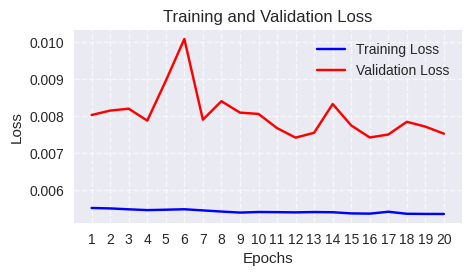

In [ ]:
fig, ax = plt.subplots(figsize=(5, 2.5))
forecaster.plot_history(ax=ax)

In [ ]:
predictions = forecaster.predict()

predictions

,NUM_ACCIDENTES
2020-01-01,1.594538


In [ ]:
# Backtesting with test data
# ==============================================================================
metrics, predictions = backtesting_forecaster_multiseries(
    forecaster=forecaster,
    steps=forecaster.max_step,
    series=data,
    levels=forecaster.levels,
    initial_train_size=len(data.loc[:fin_val, :]), # Datos de entrenamiento + validación
    metric="mean_absolute_error",
    verbose=False,
    refit=False,
)

Epoch 1/20
864/864 ━━━━━━━━━━━━━━━━━━━━ 149s 171ms/step - loss: 0.0057 - val_loss: 0.0068
Epoch 2/20
864/864 ━━━━━━━━━━━━━━━━━━━━ 127s 146ms/step - loss: 0.0057 - val_loss: 0.0067
Epoch 3/20
864/864 ━━━━━━━━━━━━━━━━━━━━ 141s 146ms/step - loss: 0.0056 - val_loss: 0.0069
Epoch 4/20
864/864 ━━━━━━━━━━━━━━━━━━━━ 122s 141ms/step - loss: 0.0058 - val_loss: 0.0071
Epoch 5/20
864/864 ━━━━━━━━━━━━━━━━━━━━ 144s 144ms/step - loss: 0.0056 - val_loss: 0.0066
Epoch 6/20
864/864 ━━━━━━━━━━━━━━━━━━━━ 145s 147ms/step - loss: 0.0056 - val_loss: 0.0066
Epoch 7/20
864/864 ━━━━━━━━━━━━━━━━━━━━ 139s 144ms/step - loss: 0.0056 - val_loss: 0.0069
Epoch 8/20
864/864 ━━━━━━━━━━━━━━━━━━━━ 140s 141ms/step - loss: 0.0056 - val_loss: 0.0067
Epoch 9/20
864/864 ━━━━━━━━━━━━━━━━━━━━ 144s 143ms/step - loss: 0.0056 - val_loss: 0.0068
Epoch 10/20
864/864 ━━━━━━━━━━━━━━━━━━━━ 142s 144ms/step - loss: 0.0056 - val_loss: 0.0066
Epoch 11/20
864/864 ━━━━━━━━━━━━━━━━━━━━ 140s 142ms/step - loss: 0.0056 - val_loss: 0.0066
Epoch 12

  0%|          | 0/8759 [00:00<?, ?it/s]

In [ ]:
# Backtesting metrics
# ==============================================================================
metrics

,levels,mean_absolute_error
0,NUM_ACCIDENTES,3.121792


In [ ]:
# % Error vs series mean
# ==============================================================================
rel_mse = 100 * metrics.loc[0, 'mean_absolute_error'] / np.mean(data["NUM_ACCIDENTES"])
print(f"Serie mean: {np.mean(data['NUM_ACCIDENTES']):0.2f}")
print(f"Relative error (mae): {rel_mse:0.2f} %")

Serie mean: 3.87
Relative error (mae): 80.66 %


In [ ]:
# Backtesting predictions
# ==============================================================================
predictions

,NUM_ACCIDENTES
2023-01-01 00:00:00,4.282868
2023-01-01 01:00:00,2.382827
2023-01-01 02:00:00,2.151572
2023-01-01 03:00:00,1.650566
2023-01-01 04:00:00,0.343441
...,...
2023-12-31 18:00:00,5.823843
2023-12-31 19:00:00,5.852298
2023-12-31 20:00:00,6.186752
2023-12-31 21:00:00,6.319563


In [ ]:
# Plotting predictions vs real values in the test set
# ==============================================================================
fig = go.Figure()
trace1 = go.Scatter(x=data_test.index, y=data_test['NUM_ACCIDENTES'], name="test", mode="lines")
trace2 = go.Scatter(x=predictions.index, y=predictions['NUM_ACCIDENTES'], name="predictions", mode="lines")
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.update_layout(
    title="Prediction vs real values in the test set",
    xaxis_title="Date time",
    yaxis_title="NUM_ACCIDENTES",
    width=750,
    height=350,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.05,
        xanchor="left",
        x=0
    )
)
fig.show()

## MODELO 2 N:1 (48h SEMANADE HISTORIAL)

In [ ]:
series = ["NUM_ACCIDENTES"] + exog_features
levels = ["NUM_ACCIDENTES"]
lags = 48
steps = 1

data = accidentes_df[series].copy()
data_train = accidentes_df_train[series].copy()
data_val = accidentes_df_val[series].copy()
data_test = accidentes_df_test[series].copy()

model2 = create_and_compile_model(
    series=data_train,
    levels=levels,
    lags=lags,
    steps=steps,
    recurrent_layer="LSTM",
    recurrent_units=[150, 75],
    dense_units=[64, 32],
    optimizer=Adam(learning_rate=0.001),
    loss=MeanSquaredError()
)
model2.summary()

keras version: 3.4.1
Using backend: tensorflow
tensorflow version: 2.17.0


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 48, 15)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 48, 150)             │          99,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 75)                  │          67,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 64)                  │           4,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 1)                   │              33 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_2 (Reshape)                  │ (None, 1, 1)                │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 174,377 (681.16 KB)

 Trainable params: 174,377 (681.16 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
forecaster2 = ForecasterRnn(
    regressor=model2,
    levels=levels,
    steps=steps,
    lags=lags,
    transformer_series=MinMaxScaler(),
    fit_kwargs={
        "epochs": 50,
        "batch_size": 132,
        "series_val": data_val,
    },
)
forecaster2

ForecasterRnn 
Regressor: <Functional name=functional_2, built=True> 
Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48] 
Transformer for series: MinMaxScaler() 
Window size: 48 
Target series, levels: ['NUM_ACCIDENTES'] 
Multivariate series (names): None 
Maximum steps predicted: [1] 
Training range: None 
Training index type: None 
Training index frequency: None 
Model parameters: {'name': 'functional_2', 'trainable': True, 'layers': [{'module': 'keras.layers', 'class_name': 'InputLayer', 'config': {'batch_shape': (None, 48, 15), 'dtype': 'float32', 'sparse': False, 'name': 'input_layer_2'}, 'registered_name': None, 'name': 'input_layer_2', 'inbound_nodes': []}, {'module': 'keras.layers', 'class_name': 'LSTM', 'config': {'name': 'lstm_4', 'trainable': True, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'return_seque

In [ ]:
forecaster2.fit(data_train)

Epoch 1/50
664/664 ━━━━━━━━━━━━━━━━━━━━ 189s 277ms/step - loss: 0.0103 - val_loss: 0.0084
Epoch 2/50
664/664 ━━━━━━━━━━━━━━━━━━━━ 203s 280ms/step - loss: 0.0097 - val_loss: 0.0083
Epoch 3/50
664/664 ━━━━━━━━━━━━━━━━━━━━ 183s 275ms/step - loss: 0.0097 - val_loss: 0.0086
Epoch 4/50
664/664 ━━━━━━━━━━━━━━━━━━━━ 188s 283ms/step - loss: 0.0057 - val_loss: 0.0081
Epoch 5/50
664/664 ━━━━━━━━━━━━━━━━━━━━ 199s 279ms/step - loss: 0.0054 - val_loss: 0.0075
Epoch 6/50
664/664 ━━━━━━━━━━━━━━━━━━━━ 200s 276ms/step - loss: 0.0053 - val_loss: 0.0079
Epoch 7/50
664/664 ━━━━━━━━━━━━━━━━━━━━ 201s 275ms/step - loss: 0.0053 - val_loss: 0.0076
Epoch 8/50
664/664 ━━━━━━━━━━━━━━━━━━━━ 186s 281ms/step - loss: 0.0053 - val_loss: 0.0091
Epoch 9/50
664/664 ━━━━━━━━━━━━━━━━━━━━ 197s 274ms/step - loss: 0.0052 - val_loss: 0.0073
Epoch 10/50
664/664 ━━━━━━━━━━━━━━━━━━━━ 186s 281ms/step - loss: 0.0052 - val_loss: 0.0076
Epoch 11/50
664/664 ━━━━━━━━━━━━━━━━━━━━ 202s 280ms/step - loss: 0.0052 - val_loss: 0.0077
Epoch 12

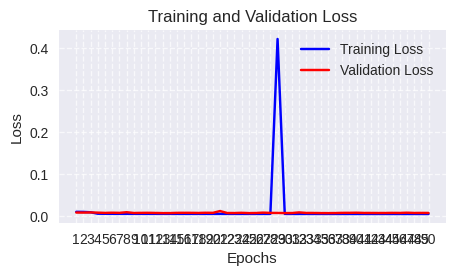

In [ ]:
fig, ax = plt.subplots(figsize=(5, 2.5))
forecaster2.plot_history(ax=ax)

In [ ]:
# Prediction
# ==============================================================================
predictions2 = forecaster2.predict()
predictions2

,NUM_ACCIDENTES
2020-01-01,2.4299


In [ ]:
# Backtesting with test data
# ==============================================================================
metrics2, predictions2 = backtesting_forecaster_multiseries(
    forecaster=forecaster2,
    steps=forecaster2.max_step,
    series=data,
    levels=forecaster2.levels,
    initial_train_size=len(data.loc[:fin_val, :]), # Datos de entrenamiento + validación
    metric="mean_absolute_error",
    verbose=False,
    refit=False,
)

Epoch 1/50
863/863 ━━━━━━━━━━━━━━━━━━━━ 242s 278ms/step - loss: 0.0054 - val_loss: 0.0065
Epoch 2/50
863/863 ━━━━━━━━━━━━━━━━━━━━ 236s 274ms/step - loss: 0.0052 - val_loss: 0.0064
Epoch 3/50
863/863 ━━━━━━━━━━━━━━━━━━━━ 264s 277ms/step - loss: 0.0052 - val_loss: 0.0064
Epoch 4/50
863/863 ━━━━━━━━━━━━━━━━━━━━ 235s 272ms/step - loss: 0.0052 - val_loss: 0.0066
Epoch 5/50
863/863 ━━━━━━━━━━━━━━━━━━━━ 265s 276ms/step - loss: 0.0052 - val_loss: 0.0063
Epoch 6/50
863/863 ━━━━━━━━━━━━━━━━━━━━ 259s 272ms/step - loss: 0.0052 - val_loss: 0.0062
Epoch 7/50
863/863 ━━━━━━━━━━━━━━━━━━━━ 266s 277ms/step - loss: 0.0052 - val_loss: 0.0063
Epoch 8/50
863/863 ━━━━━━━━━━━━━━━━━━━━ 261s 276ms/step - loss: 0.0052 - val_loss: 0.0062
Epoch 9/50
863/863 ━━━━━━━━━━━━━━━━━━━━ 240s 278ms/step - loss: 0.0051 - val_loss: 0.0062
Epoch 10/50
863/863 ━━━━━━━━━━━━━━━━━━━━ 259s 275ms/step - loss: 0.0052 - val_loss: 0.0061
Epoch 11/50
863/863 ━━━━━━━━━━━━━━━━━━━━ 262s 275ms/step - loss: 0.0052 - val_loss: 0.0061
Epoch 12

  0%|          | 0/8759 [00:00<?, ?it/s]

In [ ]:
metrics2

,levels,mean_absolute_error
0,NUM_ACCIDENTES,3.147438


In [ ]:
rel_mse = 100 * metrics2.loc[0, 'mean_absolute_error'] / np.mean(data["NUM_ACCIDENTES"])
print(f"Serie mean: {np.mean(data['NUM_ACCIDENTES']):0.2f}")
print(f"Relative error (mae): {rel_mse:0.2f} %")

Serie mean: 3.87
Relative error (mae): 81.33 %


In [ ]:
# Backtesting predictions
# ==============================================================================
predictions2

,NUM_ACCIDENTES
2023-01-01 00:00:00,4.109004
2023-01-01 01:00:00,4.235575
2023-01-01 02:00:00,3.515975
2023-01-01 03:00:00,3.491240
2023-01-01 04:00:00,3.152512
...,...
2023-12-31 18:00:00,7.249620
2023-12-31 19:00:00,7.371847
2023-12-31 20:00:00,7.054806
2023-12-31 21:00:00,5.917257


In [ ]:
# Plotting predictions vs real values in the test set
# ==============================================================================
fig = go.Figure()
trace1 = go.Scatter(x=data_test.index, y=data_test['NUM_ACCIDENTES'], name="test", mode="lines")
trace2 = go.Scatter(x=predictions2.index, y=predictions2['NUM_ACCIDENTES'], name="predictions", mode="lines")
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.update_layout(
    title="Prediction vs real values in the test set",
    xaxis_title="Date time",
    yaxis_title="NUM_ACCIDENTES",
    width=750,
    height=350,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.05,
        xanchor="left",
        x=0
    )
)
fig.show()

## modelo3 N:1: 1 semana lag

In [ ]:
series = ["NUM_ACCIDENTES"] + exog_features
levels = ["NUM_ACCIDENTES"]
lags = 168
steps = 1

data = accidentes_df[series].copy()
data_train = accidentes_df_train[series].copy()
data_val = accidentes_df_val[series].copy()
data_test = accidentes_df_test[series].copy()

model3 = create_and_compile_model(
    series=data_train,
    levels=levels,
    lags=lags,
    steps=steps,
    recurrent_layer="LSTM",
    recurrent_units=[200, 100],
    dense_units=[132, 64],
    optimizer=Adam(learning_rate=0.001),
    loss=MeanSquaredError()
)
model3.summary()

keras version: 3.4.1
Using backend: tensorflow
tensorflow version: 2.17.0


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 168, 15)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 168, 200)            │         172,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 100)                 │         120,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 132)                 │          13,332 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 64)                  │           8,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 1)                   │              65 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_2 (Reshape)                  │ (None, 1, 1)                │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 315,109 (1.20 MB)

 Trainable params: 315,109 (1.20 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
forecaster3 = ForecasterRnn(
    regressor=model3,
    levels=levels,
    steps=steps,
    lags=lags,
    transformer_series=MinMaxScaler(),
    fit_kwargs={
        "epochs": 25,
        "batch_size": 132,
       "callbacks": [
            EarlyStopping(monitor="val_loss", patience=5)
        ],
        "series_val": data_val,
    },
)
forecaster3

ForecasterRnn 
Regressor: <Functional name=functional_2, built=True> 
Lags: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168] 
Transformer for series: MinMaxScaler() 
Window size: 168 
Target series, levels: ['NUM_ACCIDENTES'] 
Multivariate series (names): None 
Maximum steps predicted: [1] 
Training range: None 
Training index type: None 
Training index frequency:

In [ ]:
forecaster3.fit(data_train)

Epoch 1/25
663/663 ━━━━━━━━━━━━━━━━━━━━ 368s 550ms/step - loss: 0.0103 - val_loss: 0.0098
Epoch 2/25
663/663 ━━━━━━━━━━━━━━━━━━━━ 351s 529ms/step - loss: 0.0100 - val_loss: 0.0080
Epoch 3/25
663/663 ━━━━━━━━━━━━━━━━━━━━ 354s 534ms/step - loss: 0.0072 - val_loss: 0.0076
Epoch 4/25
663/663 ━━━━━━━━━━━━━━━━━━━━ 360s 543ms/step - loss: 0.0054 - val_loss: 0.0077
Epoch 5/25
663/663 ━━━━━━━━━━━━━━━━━━━━ 354s 535ms/step - loss: 0.0053 - val_loss: 0.0075
Epoch 6/25
663/663 ━━━━━━━━━━━━━━━━━━━━ 359s 541ms/step - loss: 0.0053 - val_loss: 0.0074
Epoch 7/25
663/663 ━━━━━━━━━━━━━━━━━━━━ 356s 537ms/step - loss: 0.0053 - val_loss: 0.0079
Epoch 8/25
663/663 ━━━━━━━━━━━━━━━━━━━━ 349s 527ms/step - loss: 0.0054 - val_loss: 0.0072
Epoch 9/25
663/663 ━━━━━━━━━━━━━━━━━━━━ 346s 522ms/step - loss: 0.0052 - val_loss: 0.0078
Epoch 10/25
663/663 ━━━━━━━━━━━━━━━━━━━━ 359s 541ms/step - loss: 0.0052 - val_loss: 0.0077
Epoch 11/25
663/663 ━━━━━━━━━━━━━━━━━━━━ 362s 547ms/step - loss: 0.0052 - val_loss: 0.0073
Epoch 12

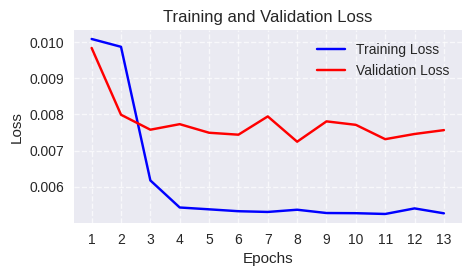

In [ ]:
fig, ax = plt.subplots(figsize=(5, 2.5))
forecaster3.plot_history(ax=ax)

In [ ]:
# Prediction
# ==============================================================================
predictions3 = forecaster3.predict()
predictions3

,NUM_ACCIDENTES
2020-01-01,1.181568


In [ ]:
# Backtesting with test data
# ==============================================================================
metrics3, predictions3 = backtesting_forecaster_multiseries(
    forecaster=forecaster3,
    steps=forecaster3.max_step,
    series=data,
    levels=forecaster3.levels,
    initial_train_size=len(data.loc[:fin_val, :]), # Datos de entrenamiento + validación
    metric="mean_absolute_error",
    verbose=False,
    refit=False,
)

Epoch 1/25
862/862 ━━━━━━━━━━━━━━━━━━━━ 424s 490ms/step - loss: 0.0055 - val_loss: 0.0065
Epoch 2/25
862/862 ━━━━━━━━━━━━━━━━━━━━ 424s 491ms/step - loss: 0.0055 - val_loss: 0.0070
Epoch 3/25
862/862 ━━━━━━━━━━━━━━━━━━━━ 432s 502ms/step - loss: 0.0055 - val_loss: 0.0064
Epoch 4/25
862/862 ━━━━━━━━━━━━━━━━━━━━ 429s 497ms/step - loss: 0.0055 - val_loss: 0.0067
Epoch 5/25
862/862 ━━━━━━━━━━━━━━━━━━━━ 438s 508ms/step - loss: 0.0054 - val_loss: 0.0063
Epoch 6/25
862/862 ━━━━━━━━━━━━━━━━━━━━ 431s 500ms/step - loss: 0.0054 - val_loss: 0.0064
Epoch 7/25
862/862 ━━━━━━━━━━━━━━━━━━━━ 443s 514ms/step - loss: 0.0054 - val_loss: 0.0063
Epoch 8/25
862/862 ━━━━━━━━━━━━━━━━━━━━ 431s 500ms/step - loss: 0.0053 - val_loss: 0.0062
Epoch 9/25
862/862 ━━━━━━━━━━━━━━━━━━━━ 430s 498ms/step - loss: 0.0055 - val_loss: 0.0062
Epoch 10/25
862/862 ━━━━━━━━━━━━━━━━━━━━ 441s 511ms/step - loss: 0.0053 - val_loss: 0.0063
Epoch 11/25
862/862 ━━━━━━━━━━━━━━━━━━━━ 448s 520ms/step - loss: 0.0054 - val_loss: 0.0063
Epoch 12

  0%|          | 0/8759 [00:00<?, ?it/s]

In [ ]:
metrics3

,levels,mean_absolute_error
0,NUM_ACCIDENTES,3.130212


In [ ]:
rel_mse = 100 * metrics3.loc[0, 'mean_absolute_error'] / np.mean(data["NUM_ACCIDENTES"])
print(f"Serie mean: {np.mean(data['NUM_ACCIDENTES']):0.2f}")
print(f"Relative error (mae): {rel_mse:0.2f} %")

Serie mean: 3.87
Relative error (mae): 80.88 %


In [ ]:
# Backtesting predictions
# ==============================================================================
predictions3

,NUM_ACCIDENTES
2023-01-01 00:00:00,3.372983
2023-01-01 01:00:00,3.191161
2023-01-01 02:00:00,3.220111
2023-01-01 03:00:00,3.159483
2023-01-01 04:00:00,2.846318
...,...
2023-12-31 18:00:00,5.637142
2023-12-31 19:00:00,6.650483
2023-12-31 20:00:00,7.315454
2023-12-31 21:00:00,7.198455


In [ ]:
# Plotting predictions vs real values in the test set
# ==============================================================================
fig = go.Figure()
trace1 = go.Scatter(x=data_test.index, y=data_test['NUM_ACCIDENTES'], name="test", mode="lines")
trace2 = go.Scatter(x=predictions3.index, y=predictions3['NUM_ACCIDENTES'], name="predictions", mode="lines")
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.update_layout(
    title="Prediction vs real values in the test set",
    xaxis_title="Date time",
    yaxis_title="NUM_ACCIDENTES",
    width=750,
    height=350,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.05,
        xanchor="left",
        x=0
    )
)
fig.show()

In [ ]:
# Guardar el modelo 3
import pickle

with open('modelo3.p', 'wb') as f:
  pickle.dump(forecaster3, f)

print("Modelo guardado correctamente.")

Modelo guardado correctamente.


In [ ]:
# Descarga el modelo 3
from google.colab import files
files.download('modelo3.p')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# prompt: como cargi lo anterior



# Cargar el modelo 3
with open('modelo3.p', 'rb') as f:
  forecaster3 = pickle.load(f)

print("Modelo cargado correctamente.")


Modelo cargado correctamente.


In [ ]:
# prompt: COMO M EGUARDO LOS MODELOS 1 2 Y 3

import pickle

# Guardar el modelo 1
with open('modelo1.pkl', 'wb') as f:
  pickle.dump(forecaster, f)

# Guardar el modelo 2
with open('modelo2.pkl', 'wb') as f:
  pickle.dump(forecaster2, f)




In [ ]:
# prompt: LO ANTERIOR SIRVE PARA DESCARGAR LOS MODELOS?

from google.colab import files

# Descarga el modelo 1
files.download('modelo1.pkl')

# Descarga el modelo 2
files.download('modelo2.pkl')




## modelo 4

In [ ]:
series = ["NUM_ACCIDENTES"] + exog_features
levels = ["NUM_ACCIDENTES"]
lags = 336
steps = 1

data = accidentes_df[series].copy()
data_train = accidentes_df_train[series].copy()
data_val = accidentes_df_val[series].copy()
data_test = accidentes_df_test[series].copy()

model3 = create_and_compile_model(
    series=data_train,
    levels=levels,
    lags=lags,
    steps=steps,
    recurrent_layer="LSTM",
    recurrent_units=[2500, 150],
    dense_units=[132, 64],
    optimizer=Adam(learning_rate=0.001),
    loss=MeanSquaredError()
)
model3.summary()

keras version: 3.4.1
Using backend: tensorflow
tensorflow version: 2.17.0


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 336, 15)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 336, 2500)           │      25,160,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 150)                 │       1,590,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 132)                 │          19,932 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           8,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              65 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_1 (Reshape)                  │ (None, 1, 1)                │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,779,109 (102.15 MB)

 Trainable params: 26,779,109 (102.15 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
forecaster3 = ForecasterRnn(
    regressor=model3,
    levels=levels,
    steps=steps,
    lags=lags,
    transformer_series=MinMaxScaler(),
    fit_kwargs={
        "epochs": 25,
        "batch_size": 132,
       "callbacks": [
            EarlyStopping(monitor="val_loss", patience=5)
        ],
        "series_val": data_val,
    },
)
forecaster3

ForecasterRnn 
Regressor: <Functional name=functional_1, built=True> 
Lags: [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217 218 219 220 221 222 223 224 225 226 227 228

In [ ]:
forecaster3.fit(data_train)

Epoch 1/25


KeyboardInterrupt: 

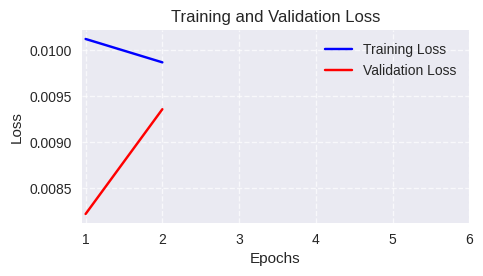

In [ ]:
fig, ax = plt.subplots(figsize=(5, 2.5))
forecaster3.plot_history(ax=ax)

In [ ]:
# Prediction
# ==============================================================================
predictions3 = forecaster3.predict()
predictions3

ValueError: `y` has missing values.

In [ ]:
# Backtesting with test data
# ==============================================================================
metrics3, predictions3 = backtesting_forecaster_multiseries(
    forecaster=forecaster3,
    steps=forecaster3.max_step,
    series=data,
    levels=forecaster3.levels,
    initial_train_size=len(data.loc[:fin_val, :]), # Datos de entrenamiento + validación
    metric="mean_absolute_error",
    verbose=False,
    refit=False,
)

In [ ]:
metrics3

In [ ]:
rel_mse = 100 * metrics3.loc[0, 'mean_absolute_error'] / np.mean(data["NUM_ACCIDENTES"])
print(f"Serie mean: {np.mean(data['NUM_ACCIDENTES']):0.2f}")
print(f"Relative error (mae): {rel_mse:0.2f} %")

Serie mean: 3.87
Relative error (mae): 80.88 %


In [ ]:
# Backtesting predictions
# ==============================================================================
predictions3

,NUM_ACCIDENTES
2023-01-01 00:00:00,3.372983
2023-01-01 01:00:00,3.191161
2023-01-01 02:00:00,3.220111
2023-01-01 03:00:00,3.159483
2023-01-01 04:00:00,2.846318
...,...
2023-12-31 18:00:00,5.637142
2023-12-31 19:00:00,6.650483
2023-12-31 20:00:00,7.315454
2023-12-31 21:00:00,7.198455


In [ ]:
# Plotting predictions vs real values in the test set
# ==============================================================================
fig = go.Figure()
trace1 = go.Scatter(x=data_test.index, y=data_test['NUM_ACCIDENTES'], name="test", mode="lines")
trace2 = go.Scatter(x=predictions3.index, y=predictions3['NUM_ACCIDENTES'], name="predictions", mode="lines")
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.update_layout(
    title="Prediction vs real values in the test set",
    xaxis_title="Date time",
    yaxis_title="NUM_ACCIDENTES",
    width=750,
    height=350,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1.05,
        xanchor="left",
        x=0
    )
)
fig.show()